# Suspense at the Wildlife Preserve: Like a Duck to Water

## Background
Mistford is a mid-size city located to the southwest of the Boonsong Lekagul Wildlife Preserve. The city has a small industrial area with four light-manufacturing endeavors. Mistford and the wildlife preserve are struggling with the possible endangerment of the Rose-Crested Blue Pipit, a locally loved bird. The bird’s nesting pairs seem to have decreased alarmingly, prompting an investigation last year implicating Kasios Office Furniture, a Mistford manufacturing firm. Since the initial investigation, the situation has evolved: Kasios insists that they have done nothing wrong! They assert that grad student Mitch Vogel and his professors are mere media-seekers trying to draw attention away from their lackadaisical research. Kasios presents itself as an extremely eco-friendly organization. They have launched their own very public investigation into the issues raised last year and are reporting very different results! It’s time to apply your data analytics expertise to help illuminate the path to good science.

The Kasios Furniture Company was implicated in environmental damage to the Boonsong Lekagul Wildlife Preserve for both dumping toxic waste and polluting the air with chemicals from its manufacturing process. But Kasios is not taking these accusations lying down, and they deny any accusation of industrial waste dumping! Kasios’ spokespersons state that there isn’t any ground contamination near any remote ranger station and they have inspected that area and found it as pristine as the rest of the preserve.

Outraged ornithology professors from Mistford College journeyed out to look over the dumping site themselves and perform soil analyses. They returned to report that the site looked like there had been recent excavation and building activities going on. Boonsong Preserve rangers later confirmed that a new ranger station was being built at that site! Soil samples taken from the site were inconclusive in detecting Methylosmolene (the toxic manufacturing chemical in the suspected dumping) or any other contaminant, as new top soil had been trucked in.

With a primary piece of evidence against Kasios now gone, investigators will need to take another approach. Professors in the Mistford College Hydrology Department have come forward with several years of water sensor readings from rivers and streams in the preserve. These samples were taken from different locations scattered throughout the area and contain measurements of several chemicals of possible interest, but they have never been analyzed due to lack of funding. Could data analytics help reveal something in this data that could make up for the soil evidence that was destroyed? Your task is to investigate the hydrology data from across the Preserve. 

You are given a map of the Preserve (with the same base as last year’s challenge), with named sampling sites indicated on the map (the names have local significance, but are just mnemonics for your study) You are also provided with readings from each sampling station over time for several different chemicals and water properties.

### Goals

1. Characterize the past and most recent situation with respect to chemical contamination in the Boonsong Lekagul waterways. Do you see any trends of possible interest in this investigation? 
2. What anomalies do you find in the waterway samples dataset? How do these affect your analysis of potential problems to the environment? Is the Hydrology Department collecting sufficient data to understand the comprehensive situation across the Preserve? What changes would you propose to make in the sampling approach to best understand the situation? 
3. After reviewing the data, do any of your findings cause particular concern for the Pipit or other wildlife? Would you suggest any changes in the sampling strategy to better understand the waterways situation in the Preserve?

In [1]:
# imports
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px

from ydata_profiling import ProfileReport
import altair as alt

%matplotlib inline

## Description and Data Characterization

The data was provided in two .csv files - one with the sample measurements and one with the units for each kind of sample.  These datasets were joined into one on the 'measure' variable.

In [2]:
# import water reading data
dat = pd.read_csv('Boonsong Lekagul waterways readings.csv')
# import measurements data (has special character - micro)
units = pd.read_csv('chemical units of measure.csv', encoding='latin1')
# join dataframes on measure
df = dat.join(units.set_index('measure'), on = 'measure')
df.head()

,id,value,location,sample date,measure,unit
0,2221,2.00,Boonsri,11-Jan-98,Water temperature,C
1,2223,9.10,Boonsri,11-Jan-98,Dissolved oxygen,mg/l
2,2227,0.33,Boonsri,11-Jan-98,Ammonium,mg/l
3,2228,0.01,Boonsri,11-Jan-98,Nitrites,mg/l
4,2229,1.47,Boonsri,11-Jan-98,Nitrates,mg/l


In [3]:
df.isna().sum()

id             0
value          0
location       0
sample date    0
measure        0
unit           0
dtype: int64

No missing values found above. However, there is in fact a missing value (an empty string) for the unit type of 'Macrozoobenthos.'  These measurements will possibly be used later in the analysis, so for now the 'unit' for Macrozoobenthos will be changed to 'unk' since the units for this are unknown.  Micrograms will be updated from 'µg/l'to 'ug/l' for ease of later typing.

In [4]:
print(df['unit'].unique())
df['unit'] = df['unit'].replace({'  ': 'unk', 'µg/l': 'ug/l'})
# unit is missing for Macrozoobenthos 
# df['measure'].unique()
print(df['unit'].unique())

['C' 'mg/l' 'µg/l' '  ']
['C' 'mg/l' 'ug/l' 'unk']


In [5]:
dups = df[df.duplicated()]
dups.head()

,id,value,location,sample date,measure,unit


There are no dubplicate values (as seen above).  However, once the 'id' column is removed there will be duplicate values presented a few cells down in the EDA profile report. These duplicate values will remain for exploratory analysis purposes.

The 'id' column is of no interest in this analysis, so that column can be removed.  'sample date' is changed to 'sample_date' for ease of later coding.

In [6]:
df = df.drop(['id'], axis = 1)
df.rename(columns = {'sample date' : 'sample_date'}, inplace = True)
df.head()

,value,location,sample_date,measure,unit
0,2.00,Boonsri,11-Jan-98,Water temperature,C
1,9.10,Boonsri,11-Jan-98,Dissolved oxygen,mg/l
2,0.33,Boonsri,11-Jan-98,Ammonium,mg/l
3,0.01,Boonsri,11-Jan-98,Nitrites,mg/l
4,1.47,Boonsri,11-Jan-98,Nitrates,mg/l


In [7]:
report = ProfileReport(df) # ypandas
# report
report.to_file("EDAreport.html")

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

This data consists of a single continuous variable (value), a date-time variable ('sample_date'), and two nominal categorical values (location and measure).  There are 10 different sampling locations and 106 differrent measures.

In [8]:
df.dtypes

value          float64
location        object
sample_date     object
measure         object
unit            object
dtype: object

In [9]:
# df['location'] = df['location'].astype('category')
# df['unit'] = df['unit'].astype('category')
# df['measure'] = df['measure'].astype('category')
df['sample_date'] = pd.to_datetime(df['sample_date'], infer_datetime_format = True)
df.dtypes

value                 float64
location               object
sample_date    datetime64[ns]
measure                object
unit                   object
dtype: object

The EDA report above showed some duplicate values.  Below, pulls the dulpicate values, and shows that for some locations and dates, there were multiple samples were taken.  

This report also found that Achara, Decha, and Tansanee have significantly less sampling that the other 7 sites (Anchara, which has the most of these 3 (2843) has less than half the number of samples that Sakda has (7320), which is the lowest of the other 7).

In [10]:
dups = df[df.duplicated()]
# dups
dups.sort_values(['measure', 'sample_date'])
# dups.head()

,value,location,sample_date,measure,unit
69238,0.001,Boonsri,2008-02-21,"1,2,3-Trichlorobenzene",ug/l
69293,0.001,Boonsri,2008-02-21,"1,2,3-Trichlorobenzene",ug/l
69901,0.001,Boonsri,2008-03-21,"1,2,3-Trichlorobenzene",ug/l
69955,0.001,Boonsri,2008-03-21,"1,2,3-Trichlorobenzene",ug/l
71699,0.001,Boonsri,2008-06-20,"1,2,3-Trichlorobenzene",ug/l
...,...,...,...,...,...
136416,0.000,Sakda,2016-12-02,"p,p-DDT",ug/l
136473,0.000,Chai,2016-12-03,"p,p-DDT",ug/l
136497,0.000,Chai,2016-12-03,"p,p-DDT",ug/l
136661,0.000,Boonsri,2016-12-10,"p,p-DDT",ug/l


Instances of multiple readings per day occurred throughout the entire dataset - between two and six readings per day.

In [11]:
# pd.set_option('display.max_rows', 200)
dfDup = df.groupby(['sample_date', 'location', 'measure'])
dfDup = dfDup.count()
dfDup = dfDup.reset_index()
dfDup = dfDup.drop(['unit'], axis = 1)
# dfDup.query('value > 1')
dfDup.query('value > 5')
# dfDup.head()

,sample_date,location,measure,value
12240,2003-04-24,Boonsri,Manganese,6
12623,2003-06-06,Boonsri,Manganese,6
12648,2003-06-13,Chai,Manganese,6
12674,2003-06-19,Boonsri,Manganese,6
12700,2003-06-21,Chai,Manganese,6
...,...,...,...,...
62198,2015-10-08,Sakda,Manganese,6
62649,2015-11-19,Kannika,Manganese,6
62682,2015-11-19,Sakda,Manganese,6
62967,2015-12-10,Kannika,Manganese,6


In [12]:
dfDup.groupby('location').mean().reset_index()

C:\Users\mmall\AppData\Local\Temp\ipykernel_14000\2715108637.py:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  dfDup.groupby('location').mean().reset_index()


,location,value
0,Achara,1.004221
1,Boonsri,2.740112
2,Busarakhan,1.005503
3,Chai,2.899499
4,Decha,1.018270
5,Kannika,2.954388
6,Kohsoom,1.007401
7,Sakda,2.927459
8,Somchair,1.005738
9,Tansanee,1.000000


Descriptive statistics sorted by standard deviation value (below) shows the measures with the most fluctuation.

In [13]:
# df.groupby('measure')['meanVal'].describe().to_csv('describe_stats.csv')
df.groupby('measure')['value'].describe().reset_index().sort_values('std', ascending = False).head(20)

,measure,count,mean,std,min,25%,50%,75%,max
52,Iron,2710.0,81.342855,1525.187169,0.000,0.25000,0.480,0.871500,37959.280000
89,Total coliforms,1615.0,58.440877,562.426353,0.000,0.22000,2.100,8.250000,16090.000000
8,Aluminium,126.0,134.702381,141.893620,0.000,58.25000,92.000,145.500000,790.000000
91,Total dissolved salts,2789.0,311.737171,132.328969,0.000,244.00000,274.000,322.000000,2330.000000
99,Zinc,2982.0,38.441235,65.160251,0.000,9.00000,22.000,45.000000,1054.000000
57,Manganese,4039.0,5.526752,64.646204,0.000,0.00665,0.039,0.080000,1910.000000
93,Total hardness,1672.0,140.081207,62.609194,3.060,108.60000,131.950,171.592000,492.799988
43,Fecal coliforms,1490.0,6.813947,44.161617,0.000,0.02000,0.200,0.780000,790.000000
21,Bicarbonates,2826.0,183.533278,38.695033,34.100,161.04000,180.560,201.900000,392.100000
30,Chlorides,3961.0,39.182910,35.539832,0.000,22.51000,30.260,41.100000,477.000000


## Answer Goal 1

Characterize the past and most recent situation with respect to chemical contamination in the Boonsong Lekagul waterways. Do you see any trends of possible interest in this investigation? 

The below heatmap shows the number of measures taken each year of each chemical.  There are a number of chemicals that were not measured consistently over the years.  The bar plot below the heatmap shows further how inconsistently each chemical was tested.

Text(0.5, 1.0, 'Counts of Measures by Year')

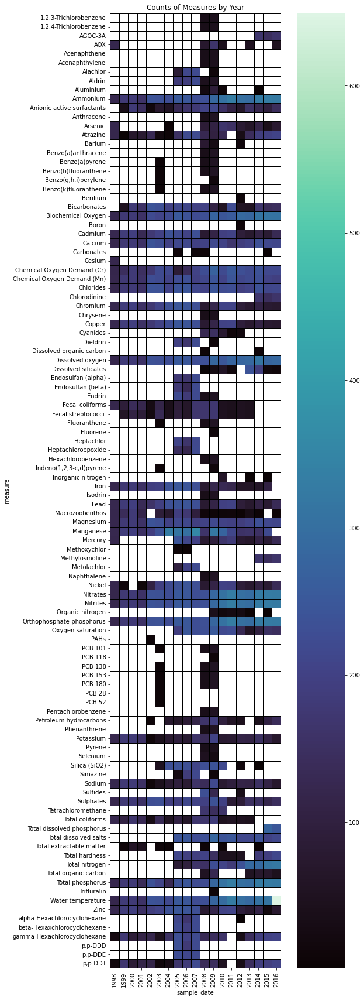

In [14]:
d = df.groupby([df.sample_date.dt.year, df.measure])
yearCounts = d.value.count()
yearCounts

yc = yearCounts.reset_index().pivot(columns = 'sample_date', index = 'measure', values = 'value')
# yc
plt.figure(figsize = (10,30))
sns.heatmap(yc, cmap = 'mako', square = True, linewidths = 0.5, linecolor = 'black')

# horizontal for slides
# yc = yearCounts.reset_index().pivot(columns = 'measure', index = 'sample_date', values = 'value')
# plt.figure(figsize = (30,10))
# sns.heatmap(yc, cmap = 'mako', square = True, linewidths = 0.5, linecolor = 'black', cbar_kws = dict(location="top"))

plt.title('Counts of Measures by Year')

<AxesSubplot:title={'center':'Number of Observations at Locations'}>

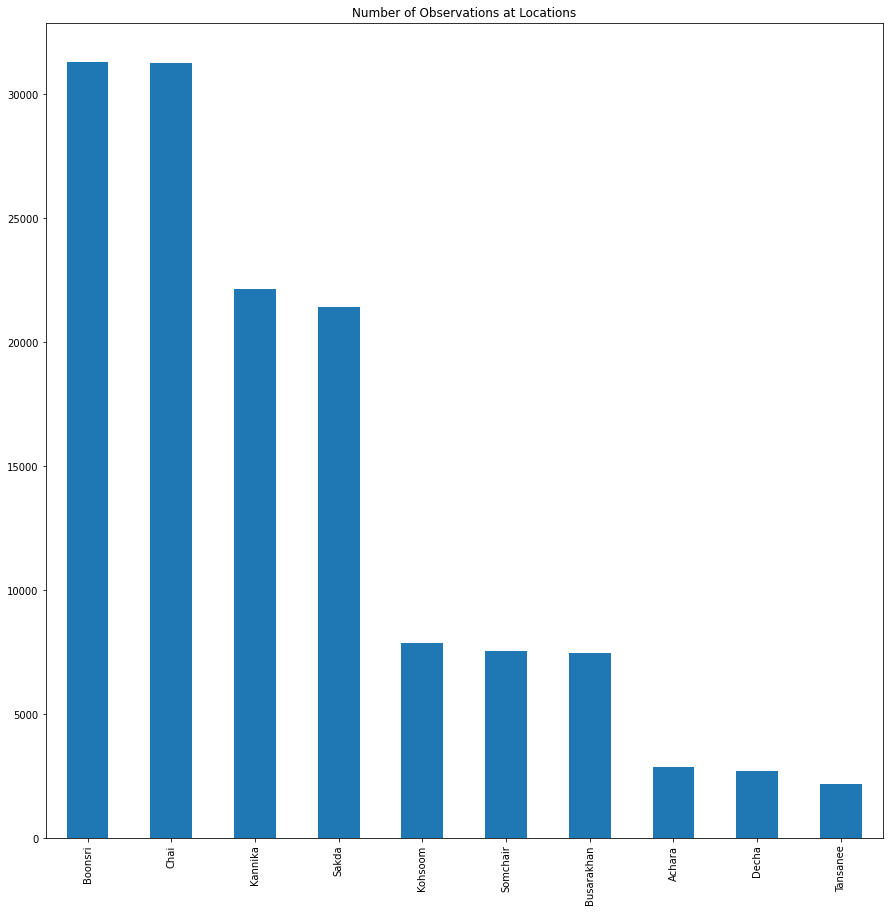

In [15]:
plt.figure(figsize = (15,15))
df['location'].value_counts().plot.bar(title = 'Number of Observations at Locations')

The heatmap below shows the max value for each measure over the years.  General increases over the years can be seen for some measures (Chlorides, Fecal coliforms, Total coliforms).  The level of Zinc has fluctuated greatly over the years, while Manganese and Leadlevels decreased.

Text(0.5, 1.0, 'Maximum Value of Measures by Year')

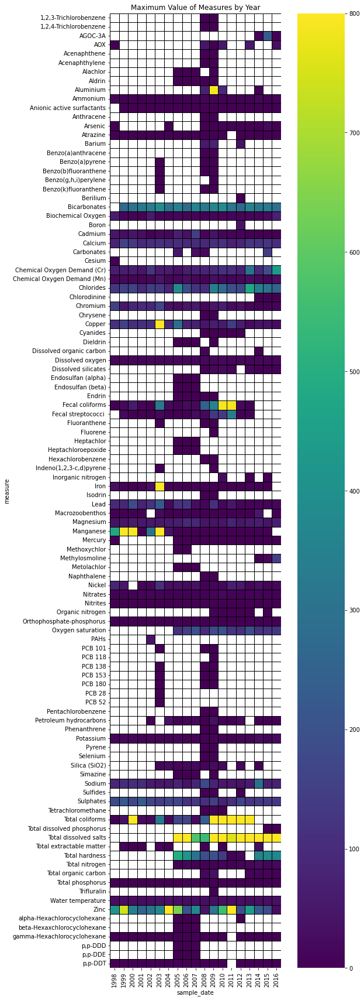

In [16]:
dmax = df.groupby([df.sample_date.dt.year, df.measure])
maxVal = dmax.value.max()
# maxVal

mv = maxVal.reset_index().pivot(columns = 'sample_date', index = 'measure', values = 'value')
# mv
plt.figure(figsize = (10,30))
sns.heatmap(mv, square = True, linewidths = 0.5, linecolor = 'black', cmap = 'viridis', vmax = 800)

# horizontal for slides
# mv = maxVal.reset_index().pivot(columns = 'measure', index = 'sample_date', values = 'value')
# plt.figure(figsize = (30,10))
# sns.heatmap(mv, cmap = 'viridis', square = True, linewidths = 0.5, linecolor = 'black', vmax = 800, cbar_kws = dict(location="top"))

plt.title('Maximum Value of Measures by Year')

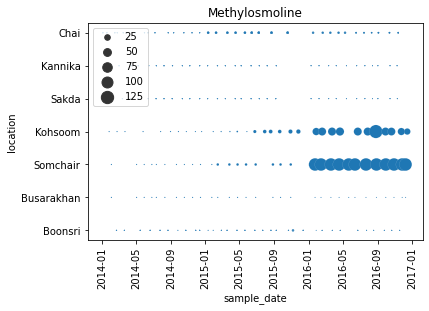

In [17]:
# Methylosmoline 
dfMethyl = df[df['measure'] == 'Methylosmoline']
dfMethyl.reset_index(inplace = True)
# dfMethyl.describe()

# plt.figure(figsize = (10,10))
sns.scatterplot(data = dfMethyl, x = 'sample_date', y = 'location', size = 'value', sizes = (1,175)).set(title = 'Methylosmoline')
plt.legend(loc = 'upper left')
plt.xticks(rotation = 90)
plt.show()

Methylosmoline was specifically mentioned in the problem statement.  The above shows the levels of Methylosmoline at each location by sample date.  There are no measurements for Decha, Tansanee, or Achara.  

The map that was provided with the data marked the location of the known dumping site - this was closest to the Kohsoom sensor.  The plot above does show increased levels of Methylosmoline there, but there are even higher levels at the Somchair site.  The three sesnors closest to Somchair, and could in theory help pinpoint a secondary dumping site are the three sites that are not on the plot above.

Descriptive statistics performed in the above Description and Data Characterization section, ordered by the standard deviation of the measures shows an execptionally large deviation in the Iron measurements.  

Quick scatter plots below for all measures by location.  Based on the scatter plots below, the heatmaps above and the descriptive statistics (ordered by standard deviation) found above, some interesting measures to investigate inclue Fecal coliforms, Total coliforms, Fecal streptococci, Aluminium, Aresenic, Barium, Cadmium, Chlorides, Chromium, Copper, Iron, Lead, Magnesium, Manganese, Methylosmoline, Nickel, Sulphates, Total dissolved salts, Zinc

C:\Users\mmall\AppData\Local\Temp\ipykernel_14000\4136972228.py:1: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  for ind, grp in df.groupby(['measure']):
C:\Users\mmall\AppData\Local\Programs\Python\Python310\lib\site-packages\pandas\plotting\_matplotlib\core.py:512: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


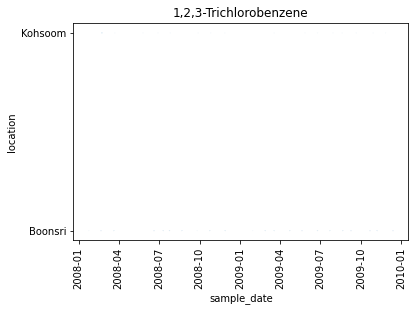

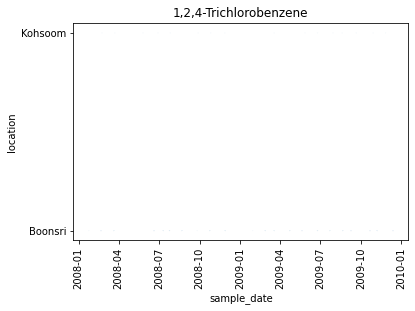

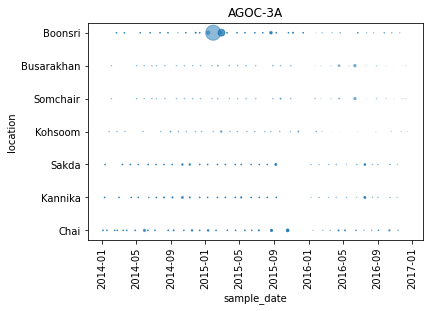

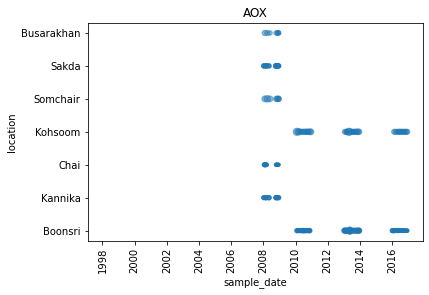

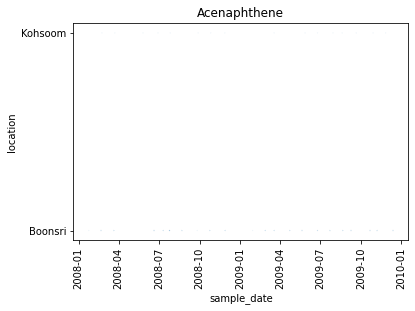

...

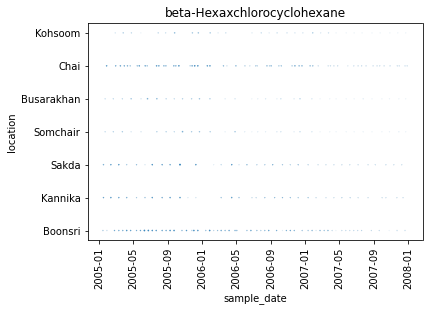

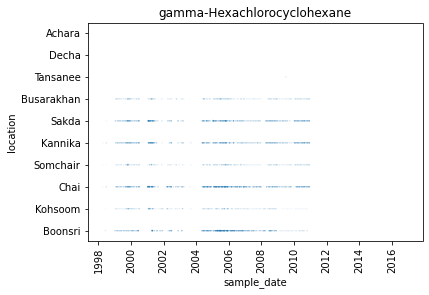

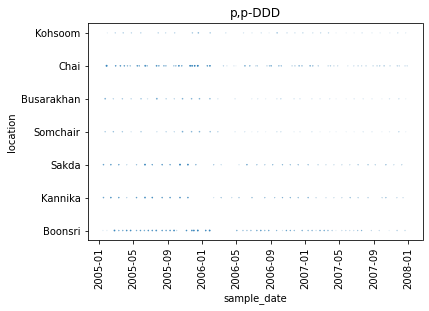

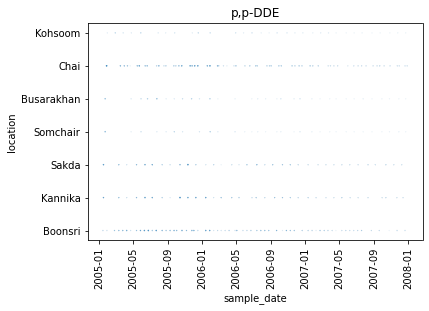

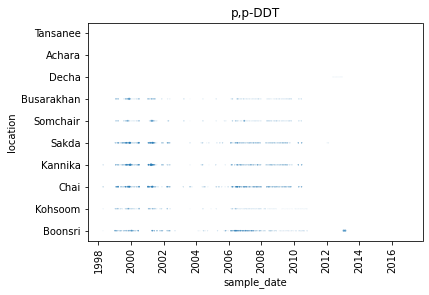

In [18]:
for ind, grp in df.groupby(['measure']):
    grp.plot.scatter(x = 'sample_date', y = 'location', s = 'value',  xlabel = 'sample_date', alpha = 0.5, title = ind, legend = True)
    plt.xticks(rotation = 90)

In [19]:
# Closer look at a few trends identified above, and broken out by type of 
# pollutant:
coli = ['Fecal coliforms', 'Fecal streptococci ', 'Total coliforms']
bacteria = df[df['measure'].isin(coli)]

fert = ['Ammonium', 'Inorganic nitrogen', 'Nitrates', 'Nitrites', 'Organic nitrogen', 
        'Total dissolved phosphorus', 'Total nitrogen', 'Total phosphorus', 'Chlorides', 'Sulphates']
fertilizers = df[df['measure'].isin(fert)]

metals = ['Aluminium', 'Arsenic', 'Berilium', 'Cadmium', 'Chromium', 'Copper', 
           'Lead', 'Magnesium', 'Manganese', 'Mercury', 'Nickel', 'Selenium', 'Zinc']
# excluding Iron due to anomaly discussed later
heavyMetal = df[df['measure'].isin(metals)]

p = ['Aldrin', 'Dieldrin', 'Endrin', 'Heptachlor', 'Heptachloroepoxide', 
     'Hexachlorobenzene','p,p-DDD','p,p-DDE', 'p,p-DDT', 'PCB 101', 'PCB 118', 
     'PCB 138', 'PCB 153', 'PCB 180', 'PCB 28', 'PCB 52']
pop = df[df['measure'].isin(p)]

Types of bacteria found in this dataset include Fecal coliforms, Total coliforms, and Fecal streptococci.  These were all found in the sampling over the years – and the levels of Total coliforms are the highest of the three, with the highest levels being read at the Kohsoom sensor.

In [20]:
# bacteria
selection = alt.selection_point(fields = ['measure'], bind = 'legend')
alt.Chart(bacteria).mark_circle().encode(alt.X('sample_date:T'), 
                                    alt.Y('location:N'),
                                    alt.Size('value:Q'),
                                    alt.Color('measure:N').scale(scheme = 'category20b'), opacity = alt.condition(selection, alt.value(1), alt.value(0.01))
                                   ).add_params(selection)#.save('bact.html')


alt.Chart(...)

Fertilizer waste included Ammonium, Inorganic Nitrogen, Nitrates, Nitrites, Organic nitrogen, Total dissolved phosphorus, Total nitrogen and Total phosphorus.  Chlorides and Sulphates were added to this group as well since they also displayed possible trends when plotting each measures’ scatter plot.  Ammonium was a bit high in Kohsoom and Tansanee, but there were high levels of all the nitrogen categories throughout the preserve.  The levels of Chlorides were also quite high in Tansanee throughout the sensors life, and there were periods of high levels of Sakda in recent years.  

In [21]:
# fetilizer (and Chlorides)
alt.data_transformers.disable_max_rows()

selection = alt.selection_point(fields = ['measure'], bind = 'legend')
alt.Chart(fertilizers).mark_circle().encode(alt.X('sample_date:T'), 
                                    alt.Y('location:N'),
                                    alt.Size('value:Q'),
                                    alt.Color('measure:N').scale(scheme = 'category10'), opacity = alt.condition(selection, alt.value(.95), alt.value(0.01))
                                   ).add_params(selection)#.save('fert.html')


alt.Chart(...)

Metal measures from this dataset included Aluminum, Arsenic, Berilium, Cadmium, Chromium, Copper, Iron, Lead, Magnesium, Manganese, Mercury, Nickel, Selenium, and Zinc.  Iron was removed due to the extreme datapoint as it through off the scale for the rest of the metals.

Most of the remaining metals did not show an interesting trend, with the exception of Zinc.  A few of these metals had spikes in earlier years (such as Aluminum in 2009 and Manganese from 1998 to 2003), but all the values taken since their peaks have stabilized at lower values.  Zinc, however, has had intermittent spikes over the entire time period of the data. 

In [22]:
# Metal
alt.data_transformers.disable_max_rows()

selection = alt.selection_point(fields = ['measure'], bind = 'legend')
alt.Chart(heavyMetal).mark_circle().encode(alt.X('sample_date:T'), 
                                    alt.Y('location:N'),
                                    alt.Size('value:Q'),
                                    alt.Color('measure:N').scale(scheme = 'category20b'), opacity = alt.condition(selection, alt.value(1), alt.value(0.01))
                                   ).add_params(selection)#.save('metal.html')


alt.Chart(...)

Persistent organic pollutants (POPs) include the measures in the dataset that were agreed upon in the Stockholm Convention – the treaty that targeted the use and release of persistent organic pollutants that were commonly used or created in manufacturing and industrial process.  These chemicals persist for a long time in the environment and have an adverse effect on human health and wildlife.  The chemical in this dataset included all the PCB’s, DDT and its breakdown components (DDE and DDD), as well as a few others.  The most concerning thing found on this plot was the relatively recent spike of DDT in 2013 at Boonsri.

In [23]:
# POPs
alt.data_transformers.disable_max_rows()

selection = alt.selection_point(fields = ['measure'], bind = 'legend')
alt.Chart(pop).mark_circle().encode(alt.X('sample_date:T'), 
                                    alt.Y('location:N'),
                                    alt.Size('value:Q'),
                                    alt.Color('measure:N').scale(scheme = 'category20b'), opacity = alt.condition(selection, alt.value(1), alt.value(0.01))
                                   ).add_params(selection)#.save('pop.html')


alt.Chart(...)

## Answer Goal 2

What anomalies do you find in the waterway samples dataset? How do these affect your analysis of potential problems to the environment? Is the Hydrology Department collecting sufficient data to understand the comprehensive situation across the Preserve? What changes would you propose to make in the sampling approach to best understand the situation? 

What anomalies do you find in the waterway samples dataset?

One of the biggest anomolies is the inconsistcies in the number of measurements taken for each measure, as well as the number of measurements taken at each sensor location.

The below shows the count of each type of measure in the full dataset.  The measures on the right end are sample significantly less that the ones on the left.  Water temperature has the most number of readings.

<AxesSubplot:title={'center':'Number of Observations of Each Measure'}>

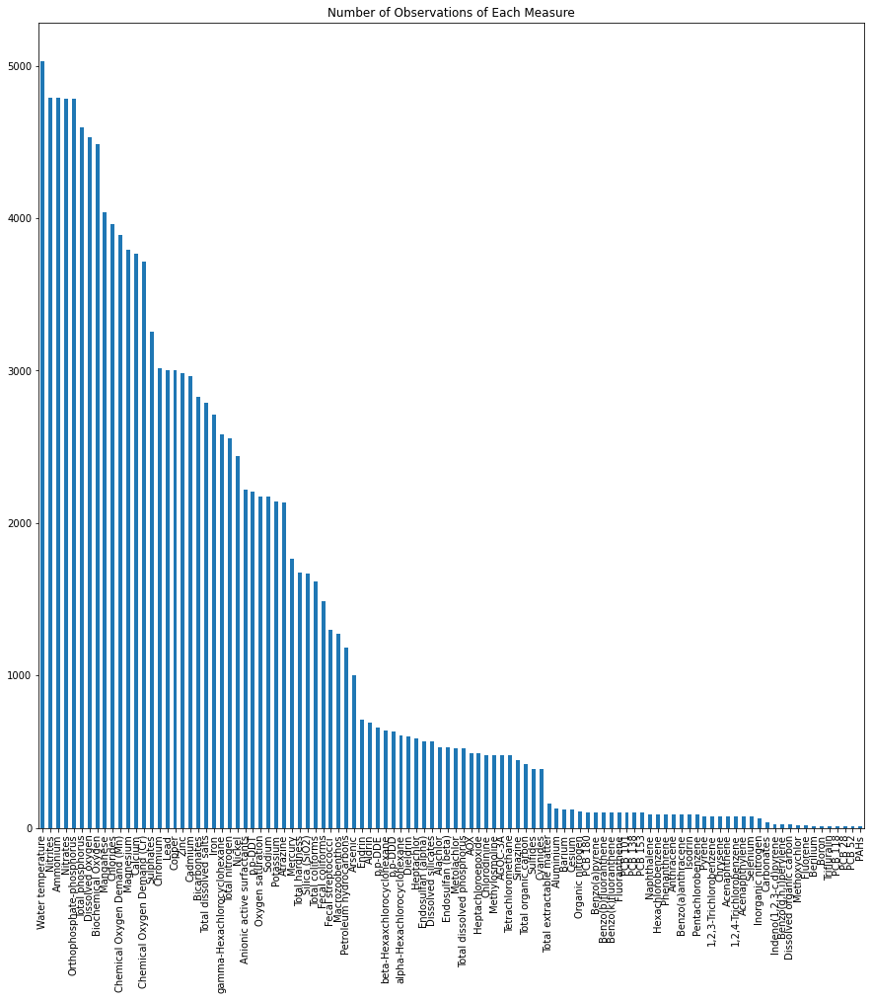

In [24]:
plt.figure(figsize = (15,15))
df['measure'].value_counts().plot.bar(title = 'Number of Observations of Each Measure')

The measurements at each location are also inconsistant.  While the bar plot from Goal 1 shows how many measurements were obtained overall for each location, the the heatmap below, indicate that all sensors were active for the entire period.  Some of the location measure inconsistencies can be explained by three of the sensors (at Achara, Decha, and Tansanee) being installed in 2009.  However, the heatmap shows that after 2009, some sensors were being read a lot more frequently (Boonsri, Chai, Kannika, Sakda).

Text(0.5, 1.0, 'Count of Location Measures by Year')

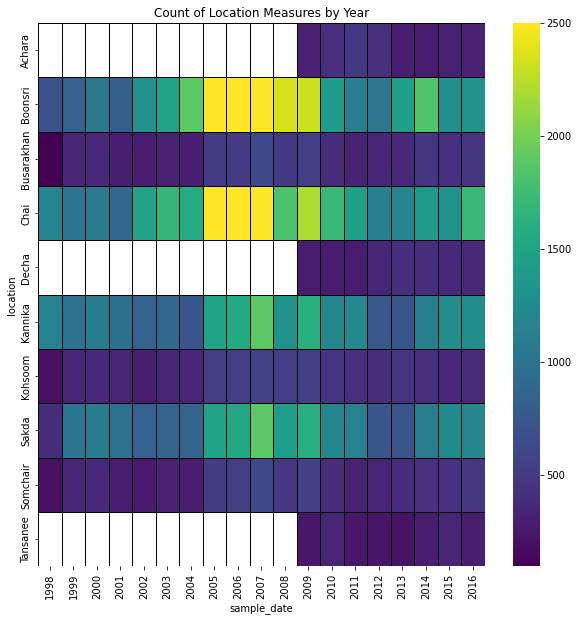

In [25]:
d = df.groupby([df.sample_date.dt.year, df.location])
yearCounts = d.value.count()
yearCounts

yc = yearCounts.reset_index().pivot(columns = 'sample_date', index = 'location', values = 'value')
# yc.fillna(0,inplace = True)
yc
plt.figure(figsize = (10,10))
sns.heatmap(yc, cmap = 'viridis', linewidths = 0.5, linecolor = 'black', vmax = 2500)

plt.title('Count of Location Measures by Year')

In the EDA above, it was found that there were instances where multiple readings of the same measure were taken multiple times a day at some locations.  Below, these multiple readings are condensed into one (as an average), and the same heat map as above was run with this new dataset.  While there is still an inconsistency with the number of readings, it is not as severe as when there were multiple readings.

These repeat readings did not have a timestamp, so the information gleaned from them is not that useful.  Why were some locations be read multiple times a day?

Below the below heatmap is a new plot of the counts of measurements at each location.  

Text(0.5, 1.0, 'Count of Location Measures by Year - Daily Average')

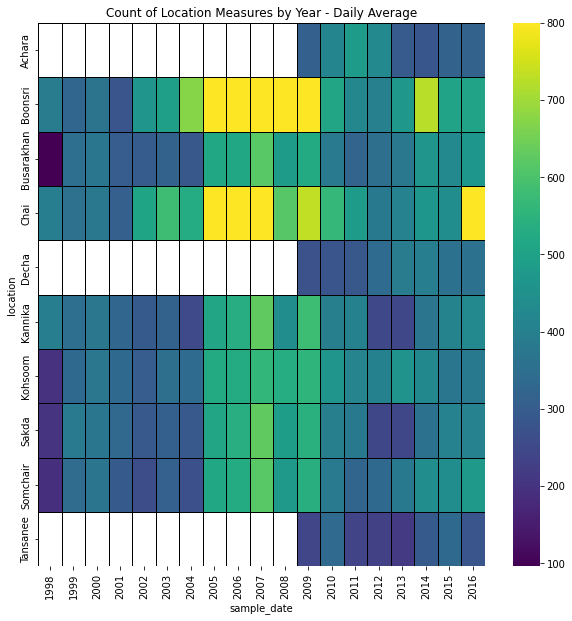

In [26]:
def reduce(dat):
    return pd.DataFrame([[ dat['value'].mean() ]], columns = [ 'meanVal'])

dfOneVal = df.groupby(['measure', 'location', 'sample_date', 'unit']).apply(reduce).reset_index(4,drop = True).reset_index(drop = False)
dfOneVal.head()

d = dfOneVal.groupby([dfOneVal.sample_date.dt.year, dfOneVal.location])
yearCounts = d.meanVal.count()
yearCounts

yc = yearCounts.reset_index().pivot(columns = 'sample_date', index = 'location', values = 'meanVal')
# yc.fillna(0,inplace = True)
yc
plt.figure(figsize = (10,10))
sns.heatmap(yc, cmap = 'viridis', linewidths = 0.5, linecolor = 'black', vmax = 800)

plt.title('Count of Location Measures by Year - Daily Average')

<AxesSubplot:title={'center':'Number of Observations at Locations - One Averaged Reading a Day'}>

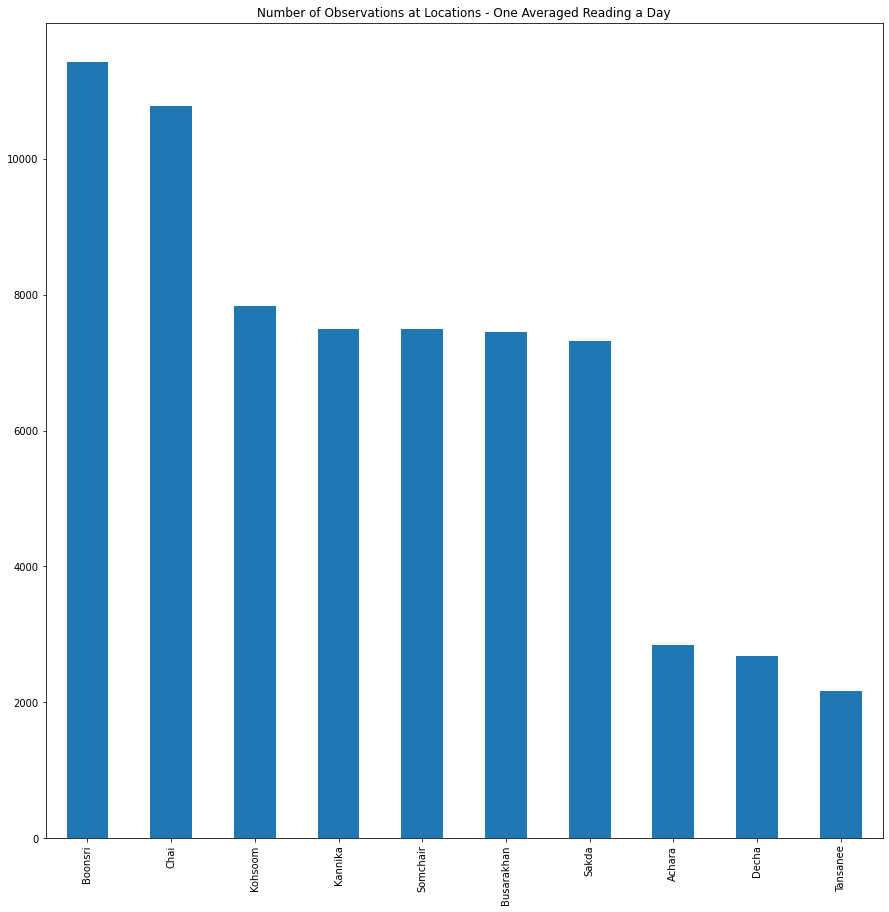

In [27]:
plt.figure(figsize = (15,15))
dfOneVal['location'].value_counts().plot.bar(title = 'Number of Observations at Locations - One Averaged Reading a Day')

Even if only data collected from 2009 onward is looked at, there is still some inconsistency, but the undersampling at Achara, Decha and Tansanee is not as severe.  Rather, the number of reading at Boonsri and Chai are now seem excessive

<AxesSubplot:title={'center':'Number of Observations at Location - 2009 and on'}>

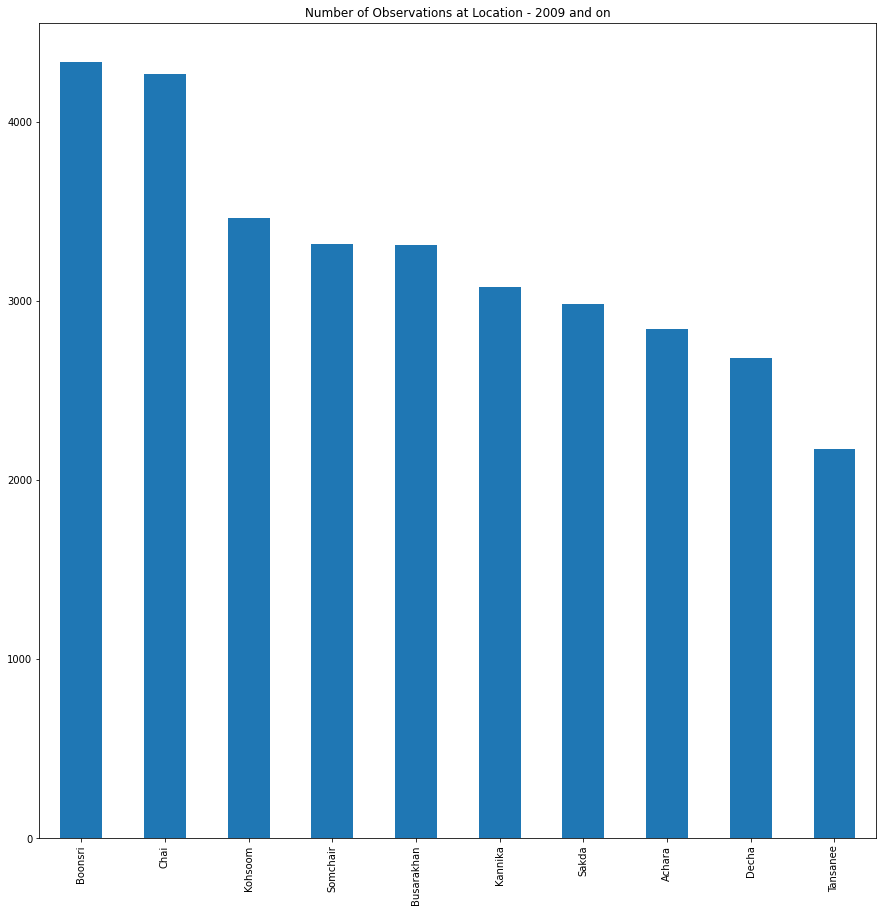

In [28]:
df2009 = dfOneVal[dfOneVal['sample_date'] > '2009-01-01']
# df2009
plt.figure(figsize = (15,15))
df2009['location'].value_counts().plot.bar(title = 'Number of Observations at Location - 2009 and on')

The heatmap below checks to see what locations were taking what measurements.  Why are some measures not being taken at some locations?

Text(0.5, 1.0, 'Count of Measures at Location')

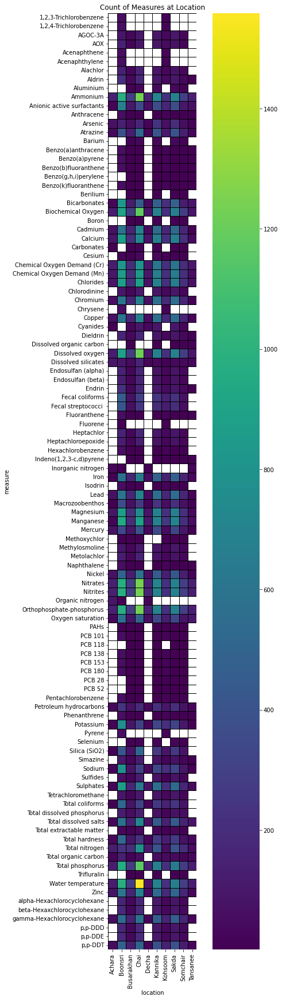

In [29]:
d = df.groupby([df.measure, df.location])
loc_meas = d.value.count()
# loc_meas

lm = loc_meas.reset_index().pivot(columns = 'location', index = 'measure', values = 'value')
# lm
plt.figure(figsize = (10,30))
sns.heatmap(lm, cmap = 'viridis', square = True,  linewidths = 0.5, linecolor = 'black')

# #horizontal
# lm = loc_meas.reset_index().pivot(columns = 'measure', index = 'location', values = 'value')
# # lm
# plt.figure(figsize = (30,10))
# sns.heatmap(lm, cmap = 'viridis', square = True,  linewidths = 0.5, linecolor = 'black',cbar_kws = dict(location="top"))

plt.title('Count of Measures at Location')

The scatterplots generated in the above Goal showed a possible abnormal value for Iron.  These abnormal values were taken on 2003-08-15.  The measures taken for Iron before and after this date were nowhere near this extreme measurement.  Additionally, outside of the measures on this date, the highest reading for Iron was 30.25 mg/l on 2002-10-15.

In [30]:
df.query('value == value.max()')
iron = df.loc[(df['measure'] == 'Iron') & (df['value'] > 30) ]
iron

,value,location,sample_date,measure,unit
22887,30.25,Boonsri,2002-10-15,Iron,mg/l
27876,37959.28,Kohsoom,2003-08-15,Iron,mg/l
27898,17970.00,Chai,2003-08-15,Iron,mg/l
27920,20688.60,Chai,2003-08-15,Iron,mg/l
27942,24790.53,Somchair,2003-08-15,Iron,mg/l
27964,21665.84,Busarakhan,2003-08-15,Iron,mg/l
27986,34413.96,Kannika,2003-08-15,Iron,mg/l
28008,32002.20,Kannika,2003-08-15,Iron,mg/l
28028,28901.59,Sakda,2003-08-15,Iron,mg/l


In [31]:
dfIron = df[df['measure'] == 'Iron']
dfIron.reset_index(inplace = True)

dfIron.query('sample_date <= "2003-08-20" & sample_date >= "2003-08-01"')

,index,value,location,sample_date,measure,unit
936,27786,0.954,Boonsri,2003-08-07,Iron,mg/l
937,27812,0.800,Boonsri,2003-08-07,Iron,mg/l
938,27838,1.332,Boonsri,2003-08-07,Iron,mg/l
939,27864,0.470,Kohsoom,2003-08-09,Iron,mg/l
940,27876,37959.280,Kohsoom,2003-08-15,Iron,mg/l
941,27898,17970.000,Chai,2003-08-15,Iron,mg/l
942,27920,20688.600,Chai,2003-08-15,Iron,mg/l
943,27942,24790.530,Somchair,2003-08-15,Iron,mg/l
944,27964,21665.840,Busarakhan,2003-08-15,Iron,mg/l
945,27986,34413.960,Kannika,2003-08-15,Iron,mg/l


<i> How do these affect your analysis of potential problems to the environment? </i>

Since the anomaly found with Iron was the only one of that kind, there was no loss of faith with regard to the dataset - for the most part the lab technicians were most likely reading the sensors correctly, and the sensors were likely in working order.  However, the anomalies discussed with the location and sampling inconsistencies make it difficult to identify potential problems in the environment.  It is hard to find a trend with incomplete data.  Taking Methylosmoline into account - if it was measured at Achara, Decha, and Tansanee, then the source of the contamination could potentially be identified.

<i> Is the Hydrology Department collecting sufficient data to understand the comprehensive situation across the Preserve? </i>

The data collected by the Hydrology Department was not sufficient to understand the comprehensive situation across the preserve.  The lack of measures taken at all locations leaves a hole in the overall story of contamination at the preserve.

Based on the map provided with the data, there appear to be three or four main waterways and their branches.  Five of the ten sensors are in one waterway, three in another, and the final two are each the only sensor in their waterway (these may connect further south, but it that was not shown on the map).  Additionally, these final two are two of the lowest read sensors – Decha and Tansanee.  So while the easternmost waterway has five sensors and a more complete picture, it is hard to know what is going on in the western waterways.

Boonsri, Chai, Kannika, and Sakda were the sensors that had multiple daily readings.  Of these, only Sakda was in a different waterway – the rest were all in the eastern-most system.  So once again, there is an imbalance of information.

<i> What changes would you propose to make in the sampling approach to best understand the situation? </i>

To better understand the situation, consistent testing across sensors and for the various measures should take place.  Some of the locations are taking readings for every measure and some are not.  This could be due to the type of sensor at each location.  If that is the case, then each location should have the kind of equipment to take all the same readings.

The sensors were also unevenly distributed.  Decha and Tansanee were the only sensors in their waterway – creating blind spots on the Preserve with regard to water contamination.  If more sensors were installed in the underrepresented waterways, then a better understanding of the situation could be inferred.


## Answer Goal 3

After reviewing the data, do any of your findings cause particular concern for the Pipit or other wildlife? Would you suggest any changes in the sampling strategy to better understand the waterways situation in the Preserve?

Methylosmoline is still a cause for concern.  To see if there are other measures that could cause immediate concern, the measures that were decteced after 2014 were looked at (that is when they started measuring for Methylosmoline).

In [32]:
df_recent = df[(df['sample_date'] > '2014-01-01')]
df_recent
df_recent.groupby('measure').mean().sort_values('value')

C:\Users\mmall\AppData\Local\Temp\ipykernel_14000\3051448947.py:3: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df_recent.groupby('measure').mean().sort_values('value')


,value
measure,
"p,p-DDT",0.000000
gamma-Hexachlorocyclohexane,0.000000
Aluminium,0.000000
Organic nitrogen,0.000000
Atrazine,0.003496
Mercury,0.014940
Nitrites,0.029315
Orthophosphate-phosphorus,0.056175
Total dissolved phosphorus,0.070859


Measures with low means are not concerning.  And in order to best visualize what was detected, these will be split in to lower and higher means.

In [33]:
# get rid of measure with low counts and mean values < 0.005
low_mean = ['p,p-DDT', 'gamma-Hexachlorocyclohexane', 'Aluminium', 'Organic nitrogen', 'Atrazine'] 
df_recent = df_recent[~df_recent['measure'].isin(low_mean)]
df_recent = df_recent[df_recent['measure'].map(df_recent['measure'].value_counts()) > 100]

# df_recent

In [34]:
small = ['AGOC-3A', 'Methylosmoline', 'Chlorodinine', 'Ammonium', 'Nitrites',
       'Nitrates', 'Total nitrogen', 'Orthophosphate-phosphorus', 'Total phosphorus',  'Potassium',  
        'Manganese', 'Biochemical Oxygen', 'Chemical Oxygen Demand (Mn)',
       'Petroleum hydrocarbons',  'Chromium', 'Lead', 'Cadmium', 'Mercury', 'Nickel', 'Arsenic',
       'Anionic active surfactants', 'Dissolved silicates', 'Total organic carbon', 'Iron', 'Total dissolved phosphorus']

large = ['Total dissolved salts', 'Total hardness', 'Bicarbonates','Oxygen saturation', 
        'Calcium', 'Sulphates','Chlorides', 'Zinc','Sodium','Chemical Oxygen Demand (Cr)',
        'Water temperature','Magnesium',  'Dissolved oxygen',  'Copper']
df_recentSmall = df_recent[df_recent['measure'].isin(small)]
df_recentLarge = df_recent[df_recent['measure'].isin(large)]

# alt.renderers.enable("html")
alt.data_transformers.disable_max_rows()

DataTransformerRegistry.enable('default')

In [35]:
selection = alt.selection_point(fields = ['measure'], bind = 'legend')
alt.Chart(df_recentSmall).mark_circle().encode(alt.X('sample_date:T'), 
                                    alt.Y('location:N'),
                                    alt.Size('value:Q'),
                                    alt.Color('measure:N').scale(scheme = 'category20b'), opacity = alt.condition(selection, alt.value(1), alt.value(0.01))
                                   ).add_params(selection)#.save('1.html')


alt.Chart(...)

Of the measures with the smaller means above, AGOC-3A could be a current concern.  There was a spike back in 2015, and it was also one of the chemicals that were looked at in an earlier study (with plume analysis).  Chlorodinine was also mentioned in that study, and while the current levels of Chlorodinine aren't high, it is a highly toxic chemical and should still be looked at.

Of the measures with higher means below, the main areas of concern would be Chlorides, as there are high levels detected thoughout this timeframe, and the levels at Tansanee are particularly high.  Some locations have higher levels of Total dissolved salts (most obvioulsy Tansanee), and this could be a cause for concern.  Too much salt in the water can be detrimental to the wildlife that lives in it and drinks it.

In [36]:
selection = alt.selection_point(fields = ['measure'], bind = 'legend')
alt.Chart(df_recentLarge).mark_circle().encode(alt.X('sample_date:T'), 
                                    alt.Y('location:N'),
                                    alt.Size('value:Q'),
                                    alt.Color('measure:N').scale(scheme = 'category10'), opacity = alt.condition(selection, alt.value(1), alt.value(0.01))
                                   ).add_params(selection)#.save('1.html')


alt.Chart(...)

<i> After reviewing the data, do any of your findings cause particular concern for the Pipit or other wildlife? </i>

After reviewing the data, Methylosmoline was still a concern.  It was already suspected that the chemical was being dumped near the Kohsoom sensor, which the data appeared to support.  However, there were even higher levels at the Somchair sensor with no current known cause.  Methylosmoline should be tested for at Achara, Decha, and Tansanee to better determine the location of the source of Methylosmoline read at the Somchair sensor.

To get an idea of any other current and present concerns, the data from 2014 onward was looked at further.  Methylosmoline and Chlorides would be the two major concerns that should be addressed.  Chlorides were high at Tansanee during this timeframe, which was one of the sensors near Somchair where elevated levels of Methylosmoline had been detected.  More attention should be given to these locations and the surrounding area.

The measures that were found to be in the waterways from 2014-2016 were split into two groups – one with the lower means and one with the higher means – for better visualization.  Both of these interactive plots can be found in the accompanying Jupyter Notebook.  There were less areas of concern with the measures found in the smaller means group.  Chlorodinine, which was looked at in a previous project at this Preserve, was found throughout the Preserve and would be classified as an area for concern.  

The measures that had higher means did not necessarily mean they were a cause for concern.  Oxygen saturation and Dissolved oxygen levels should not be low – and their levels were consistent throughout this recent timeframe.  Chlorides were the main concern found in this set.  The levels of Chlorides were not uniform across the Preserve at this time, with the highest spikes being seen in Tansanee.  It could also be worth keeping an eye on the level of Total dissolved salts as too much salt in a freshwater system can be detrimental to the surrounding wildlife.  Tansanee has the highest regular levels of Total dissolved salts at over 600 mg/l in Tansanee.	

<i> Would you suggest any changes in the sampling strategy to better understand the waterways situation in the Preserve? </i>

To better understand the waterways situation, testing should be more consistent and uniform across the locations and measures.  If the sensors at Achara, Decha, and Tansanee had been recording values for Methylosmoline, it could have given a better idea of where to look for this other potential dumping site.

More sensors should be added to the waterways - specifically in the waterways in which there was only one sensor (Decha and Tansanee).  Half of all sensors were in the easternmost waterway.  Redistributing some of these sensors to other waterways would create holes in the eastern picture, so it would be ideal to add a couple new sensors to the west.
This data had not been analyzed before due to lack of resources.  Perhaps the Hydrology Department could partner with another department on campus who could help them analyze the data as they collect it.  If analysis were performed in real time (or near real time), then problems could be addressed sooner – before there was a decline in wildlife populations.
	
